In [ ]:
!pip install opencv-python-headless matplotlib numpy -q

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
from pathlib import Path
import random
import os

random.seed(42)
np.random.seed(42)
print("Ready.")

Ready.


In [ ]:
from google.colab import files
print("Upload kaggle.json ↓")
files.upload()

!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d shashwatwork/knee-osteoarthritis-dataset-with-severity \
    --unzip -q
print("Download complete.")

for candidate in ["train",
                  "dataset/train",
                  "knee-osteoarthritis-dataset-with-severity/train"]:
    if Path(candidate).exists():
        TRAIN_ROOT = Path(candidate)
        break
else:
    !ls
    raise FileNotFoundError("Cannot locate train/ — check ls output above.")

print(f"Train root: {TRAIN_ROOT}")
for c in range(5):
    n = len(list((TRAIN_ROOT / str(c)).glob("*.*")))
    print(f"  KL{c}: {n} images")

Upload kaggle.json ↓


Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/shashwatwork/knee-osteoarthritis-dataset-with-severity
License(s): Attribution 4.0 International (CC BY 4.0)
Download complete.
Train root: train
  KL0: 2286 images
  KL1: 1046 images
  KL2: 1516 images
  KL3: 757 images
  KL4: 173 images


In [ ]:
def load_and_preprocess(path: Path, size: int = 512) -> np.ndarray:
    img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise FileNotFoundError(f"Cannot read: {path}")
    img   = cv2.resize(img, (size, size), interpolation=cv2.INTER_LANCZOS4)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img   = clahe.apply(img)
    return img.astype(np.float32) / 255.0


def extract_7_crops(img, x1, y1, x2, y2, joint_row, crop_size=224):
    def _resize(region):
        u8 = (np.clip(region, 0, 1) * 255).astype(np.uint8)
        return cv2.resize(u8, (crop_size, crop_size),
                          interpolation=cv2.INTER_LANCZOS4)
    crops = []
    crops.append(_resize(img[y1:y2, x1:x2]))
    cx = (x1 + x2) // 2
    crops.append(_resize(img[y1:y2, x1:cx]))
    crops.append(_resize(img[y1:y2, cx:x2]))
    roi_h = int((y2 - y1) * 0.28)
    roi_w = int((x2 - x1) * 0.28)
    rois  = [
        (x1 + roi_w//2, joint_row),
        (x2 - roi_w//2, joint_row),
        (x1 + roi_w//2, joint_row + roi_h),
        (x2 - roi_w//2, joint_row + roi_h),
    ]
    for cx_r, cy_r in rois:
        rx1 = max(0, cx_r - roi_w//2)
        ry1 = max(0, cy_r - roi_h//2)
        rx2 = min(img.shape[1], cx_r + roi_w//2)
        ry2 = min(img.shape[0], cy_r + roi_h//2)
        crops.append(_resize(img[ry1:ry2, rx1:rx2]))
    return crops

In [ ]:
CLASSES     = [0, 1, 2, 3, 4]
N_PER_CLASS = 2

KL_COLORS = {
    0: "#4CAF50",
    1: "#8BC34A",
    2: "#FFC107",
    3: "#FF5722",
    4: "#B71C1C",
}

KL_LABELS = {
    0: "KL0 — Normal",
    1: "KL1 — Doubtful",
    2: "KL2 — Mild",
    3: "KL3 — Moderate",
    4: "KL4 — Severe",
}

COL_TITLES = [
    "CLAHE Input",
    "Global",
    "Medial\nCompartment",
    "Lateral\nCompartment",
    "ROI\nMedial Femur",
    "ROI\nLateral Femur",
    "ROI\nMedial Tibia",
    "ROI\nLateral Tibia",
]

COL_CMAPS = ["gray", "gray", "gray", "gray",
             "gray", "gray", "gray", "gray"]

samples = {}
for cls in CLASSES:
    cls_dir  = TRAIN_ROOT / str(cls)
    all_imgs = sorted(cls_dir.glob("*.png")) + sorted(cls_dir.glob("*.jpg"))
    samples[cls] = random.sample(all_imgs, N_PER_CLASS)

print("Selected samples:")
for cls, paths in samples.items():
    print(f"  {KL_LABELS[cls]}: {[p.name for p in paths]}")

Selected samples:
  KL0 — Normal: ['9225871L.png', '9041946L.png']
  KL1 — Doubtful: ['9528258R.png', '9461110L.png']
  KL2 — Mild: ['9340335R.png', '9210045R.png']
  KL3 — Moderate: ['9994848R.png', '9133340L.png']
  KL4 — Severe: ['9800285R.png', '9173013L.png']


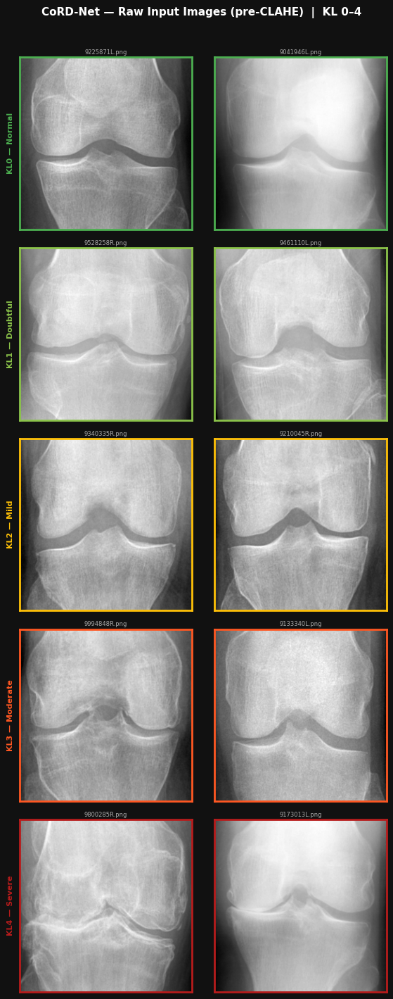

In [ ]:
fig, axes = plt.subplots(5, N_PER_CLASS, figsize=(N_PER_CLASS * 3, 14))
fig.patch.set_facecolor("#111")
fig.suptitle("CoRD-Net — Raw Input Images (pre-CLAHE)  |  KL 0–4",
             color="white", fontsize=11, fontweight="bold", y=1.01)

for row, cls in enumerate(CLASSES):
    for col, p in enumerate(samples[cls]):
        img = cv2.imread(str(p), cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (256, 256), interpolation=cv2.INTER_LANCZOS4)

        ax = axes[row, col]
        ax.imshow(img, cmap="gray")
        ax.set_xticks([]); ax.set_yticks([])
        for sp in ax.spines.values():
            sp.set_edgecolor(KL_COLORS[cls]); sp.set_linewidth(2)
        ax.set_facecolor("#1a1a1a")

        if col == 0:
            ax.set_ylabel(KL_LABELS[cls], color=KL_COLORS[cls],
                          fontsize=8, fontweight="bold", labelpad=6)
        ax.set_title(p.name[:18], color="#aaa", fontsize=6, pad=3)

plt.tight_layout()
plt.savefig("cordnet_raw_inputs.png", dpi=130,
            bbox_inches="tight", facecolor="#111")
plt.show()

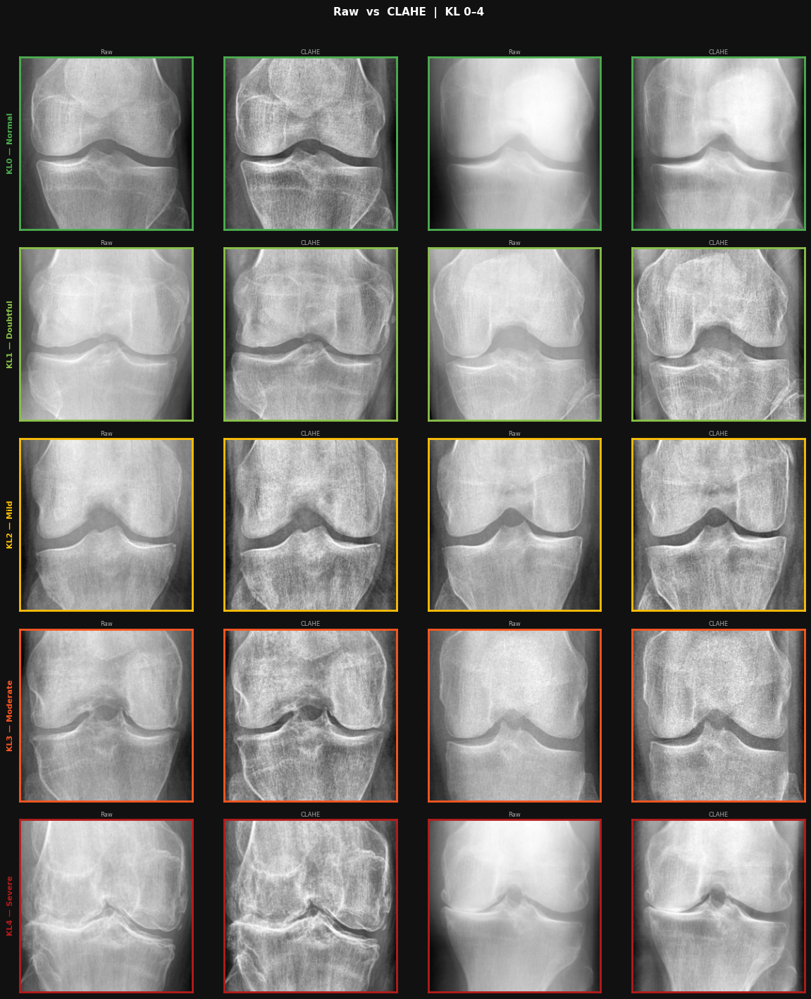

In [ ]:
fig, axes = plt.subplots(5, N_PER_CLASS * 2, figsize=(N_PER_CLASS * 6, 14))
fig.patch.set_facecolor("#111")
fig.suptitle("Raw  vs  CLAHE  |  KL 0–4", color="white",
             fontsize=11, fontweight="bold", y=1.01)

for row, cls in enumerate(CLASSES):
    for col, p in enumerate(samples[cls]):
        raw   = cv2.imread(str(p), cv2.IMREAD_GRAYSCALE)
        raw   = cv2.resize(raw, (256, 256), interpolation=cv2.INTER_LANCZOS4)
        clahe = (load_and_preprocess(p, 256) * 255).astype(np.uint8)

        for offset, img, label in [(0, raw, "Raw"), (1, clahe, "CLAHE")]:
            ax = axes[row, col * 2 + offset]
            ax.imshow(img, cmap="gray")
            ax.set_xticks([]); ax.set_yticks([])
            ax.set_title(label, color="#aaa", fontsize=6, pad=3)
            for sp in ax.spines.values():
                sp.set_edgecolor(KL_COLORS[cls]); sp.set_linewidth(2)
            ax.set_facecolor("#1a1a1a")

        if col == 0:
            axes[row, 0].set_ylabel(KL_LABELS[cls], color=KL_COLORS[cls],
                                    fontsize=8, fontweight="bold", labelpad=6)

plt.tight_layout()
plt.savefig("cordnet_raw_vs_clahe.png", dpi=130,
            bbox_inches="tight", facecolor="#111")
plt.show()

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {DEVICE}")

# ─────────────────────────────────────────────────────────────────────────────
# KneeLocalizer: 4-layer CNN + Spatial Transformer Network
#
# Architecture per CoRD-Net Stage 1 specification.
# STN reference: Jaderberg et al. (2015) "Spatial Transformer Networks"
#
# The 4-layer CNN acts as the localization network — it predicts
# 6 affine parameters θ (2×3 matrix) that define the spatial
# transformation applied to the input radiograph to crop and
# align the knee joint region.
#
# STN is differentiable end-to-end: localization and classification
# can be jointly fine-tuned once annotated bounding boxes are available.
# ─────────────────────────────────────────────────────────────────────────────

class KneeLocalizer(nn.Module):
    def __init__(self, img_size: int = 512):
        super().__init__()
        self.img_size = img_size

        # ── 4-layer CNN (localization network) ───────────────────────────────
        self.loc_net = nn.Sequential(
            # Layer 1 : 1→32,  7×7, stride 2  → 256×256 → pool → 128×128
            nn.Conv2d(1, 32, kernel_size=7, stride=2, padding=3),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),

            # Layer 2 : 32→64, 5×5, stride 2  → 64×64  → pool → 32×32
            nn.Conv2d(32, 64, kernel_size=5, stride=2, padding=2),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),

            # Layer 3 : 64→128, 3×3            → 32×32  → pool → 16×16
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),

            # Layer 4 : 128→256, 3×3           → 16×16  → gap → 4×4
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.AdaptiveAvgPool2d(4),
        )

        # ── STN regressor: predicts 6 affine parameters ───────────────────
        self.fc_loc = nn.Sequential(
            nn.Linear(256 * 4 * 4, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.3),
            nn.Linear(512, 6),
        )

        # Initialize as identity transform (no-op at start of training)
        self.fc_loc[-1].weight.data.zero_()
        self.fc_loc[-1].bias.data.copy_(
            torch.tensor([1, 0, 0, 0, 1, 0], dtype=torch.float)
        )

    def forward(self, x: torch.Tensor):
        """
        x     : (B, 1, H, W) float32, normalized to [0, 1]
        out   : (B, 1, H, W) — spatially transformed (localized) image
        theta : (B, 2, 3)    — affine parameters predicted by CNN
        """
        xs    = self.loc_net(x).view(x.size(0), -1)
        theta = self.fc_loc(xs).view(-1, 2, 3)
        grid  = F.affine_grid(theta, x.size(), align_corners=False)
        out   = F.grid_sample(x, grid,
                              mode='bilinear',
                              padding_mode='border',
                              align_corners=False)
        return out, theta

    def localize_numpy(self, img_np: np.ndarray) -> tuple:
        """
        Convenience wrapper for inference on a single numpy image (H×W float32).
        Returns: (localized_np, theta_np, bbox_tuple)
        """
        self.eval()
        with torch.no_grad():
            t   = torch.from_numpy(img_np).unsqueeze(0).unsqueeze(0).to(DEVICE)
            out, theta = self(t)

            localized_np = out.squeeze().cpu().numpy()
            theta_np     = theta.squeeze().cpu().numpy()

            # Convert affine theta → approximate bbox in pixel space
            H, W = img_np.shape
            cx = int((theta_np[0, 2] + 1) / 2 * W)
            cy = int((theta_np[1, 2] + 1) / 2 * H)
            sx = float(theta_np[0, 0])
            sy = float(theta_np[1, 1])
            half_w = int(abs(sx) * W / 2)
            half_h = int(abs(sy) * H / 2)

            x1 = max(0, cx - half_w)
            y1 = max(0, cy - half_h)
            x2 = min(W, cx + half_w)
            y2 = min(H, cy + half_h)
            joint_row = cy

        return localized_np, theta_np, (x1, y1, x2, y2, joint_row)

localizer = KneeLocalizer(img_size=512).to(DEVICE)
print(f"KneeLocalizer parameters: "
      f"{sum(p.numel() for p in localizer.parameters()):,}")

Device: cuda
KneeLocalizer parameters: 2,523,590


In [ ]:
# ── Full Stage 1 pipeline — now uses trained KneeLocalizer ───────────────────
def run_stage1(path: Path) -> dict:
    preprocessed              = load_and_preprocess(path)
    localized_np, theta_np, \
    (x1, y1, x2, y2, jrow)   = localizer.localize_numpy(preprocessed)
    crops                     = extract_7_crops(
                                    preprocessed, x1, y1, x2, y2, jrow)
    return {
        "path":         path,
        "preprocessed": preprocessed,
        "localized":    localized_np,
        "theta":        theta_np,
        "bbox":         (x1, y1, x2, y2),
        "joint_row":    jrow,
        "crops":        crops,
    }

print("Stage 1 functions ready (STN-based localization).")

Stage 1 functions ready (STN-based localization).


In [ ]:
# ─────────────────────────────────────────────────────────────────────────────
# Since we have no radiologist-annotated bounding boxes, we bootstrap the STN
# using pseudo-labels generated by the signal heuristic.
#
# Pseudo-label → affine theta conversion:
#   Given bbox (x1,y1,x2,y2) in pixel space for an H×W image,
#   the affine matrix that crops that region is:
#       theta = [[sx,  0, tx],
#                [ 0, sy, ty]]
#   where:
#       sx = (x2-x1)/W,  sy = (y2-y1)/H   (scale)
#       tx = (x1+x2)/W - 1,  ty = (y1+y2)/H - 1  (translation, normalized)
#
# This is a reasonable prototype approach. Production CoRD-Net should be
# retrained with radiologist-annotated bounding boxes or U-Net masks
# per Li et al. (2023).
# ─────────────────────────────────────────────────────────────────────────────

# ── Heuristic for pseudo-label generation ────────────────────────────────────
def heuristic_bbox(img: np.ndarray):
    H, W  = img.shape
    uint8 = (img * 255).astype(np.uint8)
    inv   = cv2.bitwise_not(uint8)
    row_profile = inv.mean(axis=1)
    s, e  = int(H * 0.20), int(H * 0.80)
    jrow  = s + int(np.argmax(row_profile[s:e]))
    margin_v, margin_h = int(H * 0.35), int(W * 0.05)
    x1 = margin_h
    y1 = max(0, jrow - margin_v)
    x2 = W - margin_h
    y2 = min(H, jrow + margin_v)
    return x1, y1, x2, y2


def bbox_to_theta(x1, y1, x2, y2, H, W) -> torch.Tensor:
    sx = (x2 - x1) / W
    sy = (y2 - y1) / H
    tx = (x1 + x2) / W - 1.0
    ty = (y1 + y2) / H - 1.0
    return torch.tensor([[sx, 0, tx],
                          [0, sy, ty]], dtype=torch.float32)


# ── Dataset ───────────────────────────────────────────────────────────────────
class KneeDataset(Dataset):
    def __init__(self, root: Path, classes, max_per_class=80, size=512):
        self.size    = size
        self.samples = []
        for cls in classes:
            imgs = sorted((root / str(cls)).glob("*.png")) + \
                   sorted((root / str(cls)).glob("*.jpg"))
            self.samples.extend(imgs[:max_per_class])
        print(f"Dataset: {len(self.samples)} images for STN training")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img = load_and_preprocess(self.samples[idx], self.size)
        x1, y1, x2, y2 = heuristic_bbox(img)
        theta_gt = bbox_to_theta(x1, y1, x2, y2, self.size, self.size)
        img_t    = torch.from_numpy(img).unsqueeze(0)
        return img_t, theta_gt


# ── Training ──────────────────────────────────────────────────────────────────
dataset    = KneeDataset(TRAIN_ROOT, CLASSES, max_per_class=80)
loader     = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=2)

optimizer  = torch.optim.Adam(localizer.parameters(), lr=1e-3)
scheduler  = torch.optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.5)
loss_fn    = nn.MSELoss()
EPOCHS     = 40

print(f"Training KneeLocalizer (4-layer CNN + STN) for {EPOCHS} epochs...")
print("-" * 55)

localizer.train()
for epoch in range(1, EPOCHS + 1):
    epoch_loss = 0.0
    for imgs, theta_gt in loader:
        imgs     = imgs.to(DEVICE)
        theta_gt = theta_gt.to(DEVICE)

        _, theta_pred = localizer(imgs)
        loss          = loss_fn(theta_pred, theta_gt)

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(localizer.parameters(), 1.0)
        optimizer.step()

        epoch_loss += loss.item()

    scheduler.step()
    avg = epoch_loss / len(loader)

    if epoch % 5 == 0 or epoch == 1:
        print(f"  Epoch [{epoch:>3}/{EPOCHS}]  "
              f"Loss: {avg:.6f}  "
              f"LR: {scheduler.get_last_lr()[0]:.6f}")

print("-" * 55)
print("STN training complete. Switching to eval mode.")
localizer.eval()
torch.save(localizer.state_dict(), "cordnet_kneelocal_stn.pt")
print("Saved: cordnet_kneelocal_stn.pt")

Dataset: 400 images for STN training
Training KneeLocalizer (4-layer CNN + STN) for 40 epochs...
-------------------------------------------------------
  Epoch [  1/40]  Loss: 0.027057  LR: 0.001000
  Epoch [  5/40]  Loss: 0.002983  LR: 0.001000
  Epoch [ 10/40]  Loss: 0.002522  LR: 0.001000
  Epoch [ 15/40]  Loss: 0.002124  LR: 0.000500
  Epoch [ 20/40]  Loss: 0.001397  LR: 0.000500
  Epoch [ 25/40]  Loss: 0.001314  LR: 0.000500
  Epoch [ 30/40]  Loss: 0.001167  LR: 0.000250
  Epoch [ 35/40]  Loss: 0.000887  LR: 0.000250
  Epoch [ 40/40]  Loss: 0.000884  LR: 0.000250
-------------------------------------------------------
STN training complete. Switching to eval mode.
Saved: cordnet_kneelocal_stn.pt


In [ ]:
results = {}

for cls in CLASSES:
    results[cls] = []
    for path in samples[cls]:
        r = run_stage1(path)
        results[cls].append(r)
        print(f"  ✓ KL{cls} | {path.name}")

print(f"\nAll {sum(len(v) for v in results.values())} images processed.")

  ✓ KL0 | 9225871L.png
  ✓ KL0 | 9041946L.png
  ✓ KL1 | 9528258R.png
  ✓ KL1 | 9461110L.png
  ✓ KL2 | 9340335R.png
  ✓ KL2 | 9210045R.png
  ✓ KL3 | 9994848R.png
  ✓ KL3 | 9133340L.png
  ✓ KL4 | 9800285R.png
  ✓ KL4 | 9173013L.png

All 10 images processed.


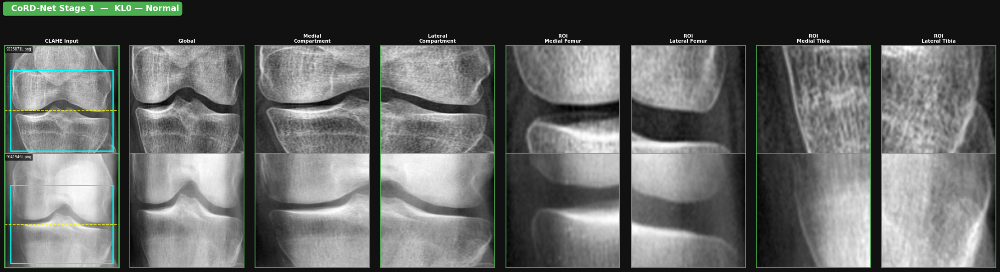

Saved: cordnet_stage1_KL0.png


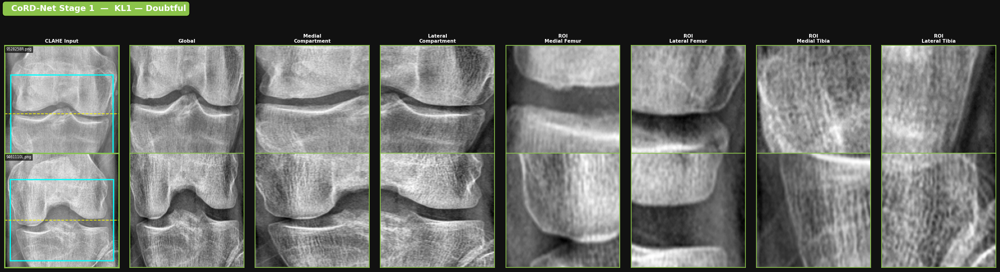

Saved: cordnet_stage1_KL1.png


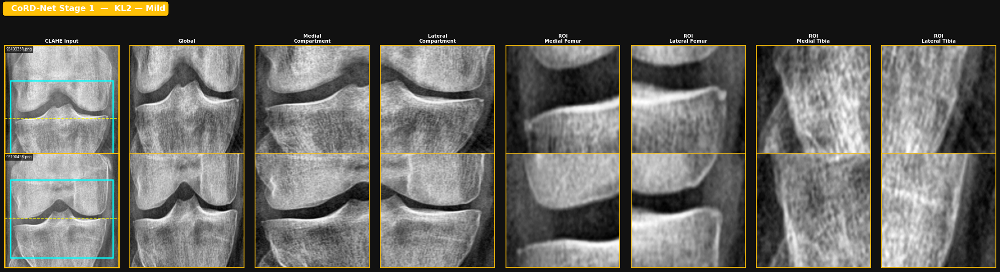

Saved: cordnet_stage1_KL2.png


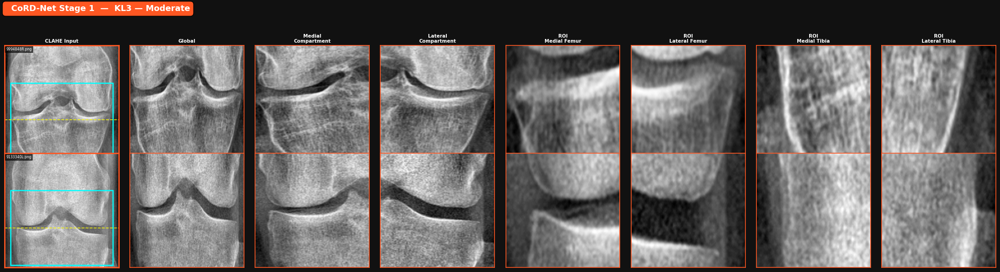

Saved: cordnet_stage1_KL3.png


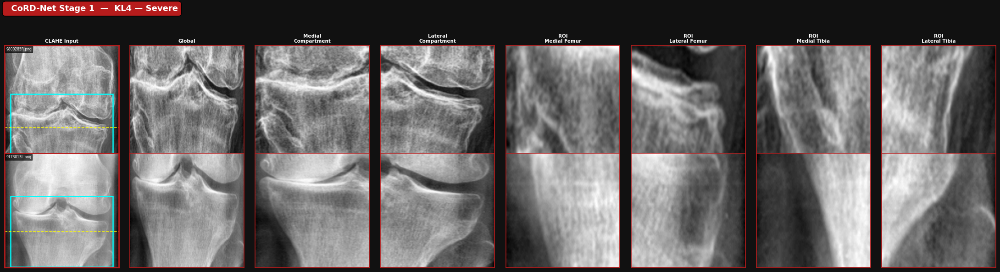

Saved: cordnet_stage1_KL4.png


In [ ]:
for cls in CLASSES:
    fig, axes = plt.subplots(N_PER_CLASS, 8, figsize=(22, 6))
    fig.patch.set_facecolor("#111111")
    fig.suptitle(
        f"  CoRD-Net Stage 1  —  {KL_LABELS[cls]}",
        fontsize=13, fontweight="bold", color="white",
        x=0.01, ha="left",
        bbox=dict(facecolor=KL_COLORS[cls], pad=5,
                  boxstyle="round,pad=0.4")
    )

    for row_idx, result in enumerate(results[cls]):
        preprocessed = result["preprocessed"]
        crops        = result["crops"]
        x1, y1, x2, y2 = result["bbox"]
        jrow         = result["joint_row"]

        # Column 0 — CLAHE input with bbox + joint line overlay
        ax0 = axes[row_idx, 0]
        ax0.imshow(preprocessed, cmap="gray")
        rect = mpatches.FancyBboxPatch(
            (x1, y1), x2-x1, y2-y1,
            linewidth=1.8, edgecolor="cyan", facecolor="none",
            boxstyle="square,pad=0"
        )
        ax0.add_patch(rect)
        ax0.axhline(y=jrow, color="yellow", linewidth=1.2,
                    linestyle="--", alpha=0.85)
        ax0.text(6, 22, result["path"].name[:18],
                 fontsize=5.5, color="white",
                 bbox=dict(facecolor="black", alpha=0.65, pad=1.5))
        ax0.set_xticks([]); ax0.set_yticks([])
        for sp in ax0.spines.values():
            sp.set_edgecolor(KL_COLORS[cls]); sp.set_linewidth(2)
        ax0.set_facecolor("#1a1a1a")

        # Columns 1–7 — 7 crops
        for ci, crop in enumerate(crops):
            ax = axes[row_idx, ci + 1]
            ax.imshow(crop, cmap=COL_CMAPS[ci + 1])
            ax.set_xticks([]); ax.set_yticks([])
            for sp in ax.spines.values():
                sp.set_edgecolor(KL_COLORS[cls]); sp.set_linewidth(1.2)
            ax.set_facecolor("#1a1a1a")

    # Column headers on first row only
    for ci, title in enumerate(COL_TITLES):
        axes[0, ci].set_title(title, fontsize=7.5,
                              color="white", fontweight="bold", pad=4)

    plt.tight_layout(rect=[0, 0, 1, 0.93])
    plt.savefig(f"cordnet_stage1_KL{cls}.png", dpi=150,
                bbox_inches="tight", facecolor="#111111")
    plt.show()
    print(f"Saved: cordnet_stage1_KL{cls}.png")

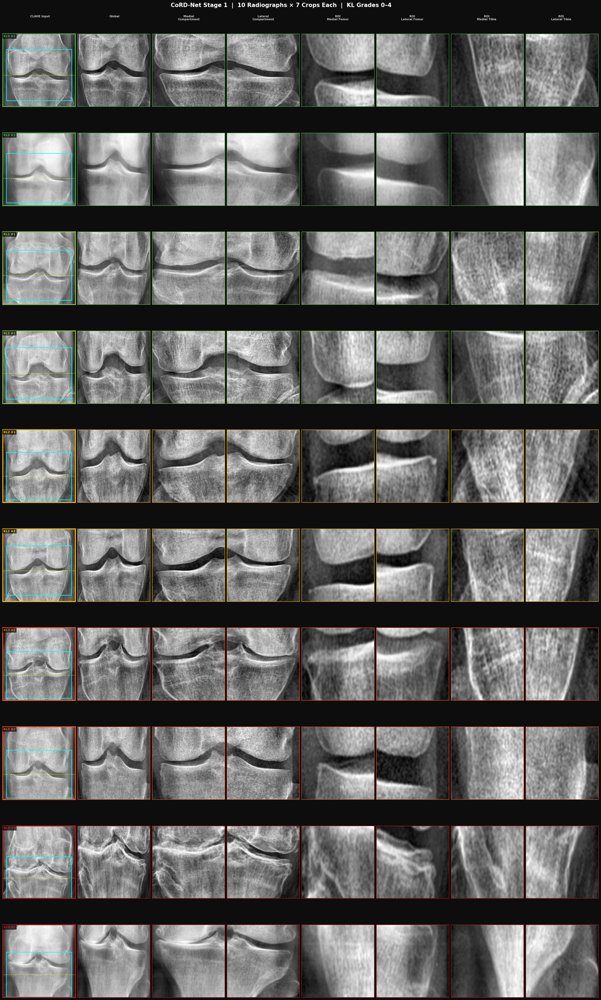

Saved: cordnet_stage1_ALL.png


In [ ]:
fig = plt.figure(figsize=(24, 38), facecolor="#0d0d0d")
gs  = gridspec.GridSpec(
    10, 8, figure=fig,
    hspace=0.05, wspace=0.03,
    left=0.07, right=0.99, top=0.97, bottom=0.01
)

fig.suptitle(
    "CoRD-Net Stage 1  |  10 Radiographs × 7 Crops Each  |  KL Grades 0–4",
    fontsize=15, fontweight="bold", color="white", y=0.99
)

# Column headers
for ci, htitle in enumerate(COL_TITLES):
    fig.text(
        0.07 + (ci / 8) * 0.92 + (0.92 / 16),
        0.978, htitle,
        ha="center", va="top",
        fontsize=7.5, color="#cccccc", fontweight="bold"
    )

row_global = 0
for cls in CLASSES:
    for img_idx, result in enumerate(results[cls]):
        preprocessed    = result["preprocessed"]
        crops           = result["crops"]
        x1, y1, x2, y2 = result["bbox"]
        jrow            = result["joint_row"]
        color           = KL_COLORS[cls]

        # Col 0 — CLAHE input
        ax_pre = fig.add_subplot(gs[row_global, 0])
        ax_pre.imshow(preprocessed, cmap="gray")
        rect = mpatches.FancyBboxPatch(
            (x1, y1), x2-x1, y2-y1,
            linewidth=1.5, edgecolor="cyan", facecolor="none",
            boxstyle="square,pad=0"
        )
        ax_pre.add_patch(rect)
        ax_pre.axhline(y=jrow, color="yellow",
                       linewidth=1, linestyle="--", alpha=0.7)
        ax_pre.text(5, 22,
                    f"KL{cls} #{img_idx+1}",
                    fontsize=8, color=color, fontweight="bold",
                    bbox=dict(facecolor="black", alpha=0.7, pad=2))
        ax_pre.set_xticks([]); ax_pre.set_yticks([])
        for sp in ax_pre.spines.values():
            sp.set_edgecolor(color); sp.set_linewidth(2.5)
        ax_pre.set_facecolor("#1a1a1a")

        # Cols 1–7 — crops
        for ci, crop in enumerate(crops):
            ax = fig.add_subplot(gs[row_global, ci + 1])
            ax.imshow(crop, cmap=COL_CMAPS[ci + 1])
            ax.set_xticks([]); ax.set_yticks([])
            for sp in ax.spines.values():
                sp.set_edgecolor(color); sp.set_linewidth(1)
            ax.set_facecolor("#1a1a1a")

        row_global += 1

plt.savefig("cordnet_stage1_ALL.png", dpi=140,
            bbox_inches="tight", facecolor="#0d0d0d")
plt.show()
print("Saved: cordnet_stage1_ALL.png")